<a href="https://colab.research.google.com/github/singhjyoti1997/Deep-Learning/blob/main/cityscapeimgae_usingGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/shuvoalok/cityscapes'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: jyoti19971111
Your Kaggle Key: ··········


100%|██████████| 199M/199M [00:02<00:00, 92.1MB/s]


In [ ]:
import os

DATA_DIR = '/content/cityscapes_'
print(os.listdir(DATA_DIR))

['img']


In [ ]:
print(os.listdir(DATA_DIR+'/img')[:10])

['train1952.png', 'train2835.png', 'train1970.png', 'train1147.png', 'train1663.png', 'train2824.png', 'train1827.png', 'train2532.png', 'train2220.png', 'train852.png']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


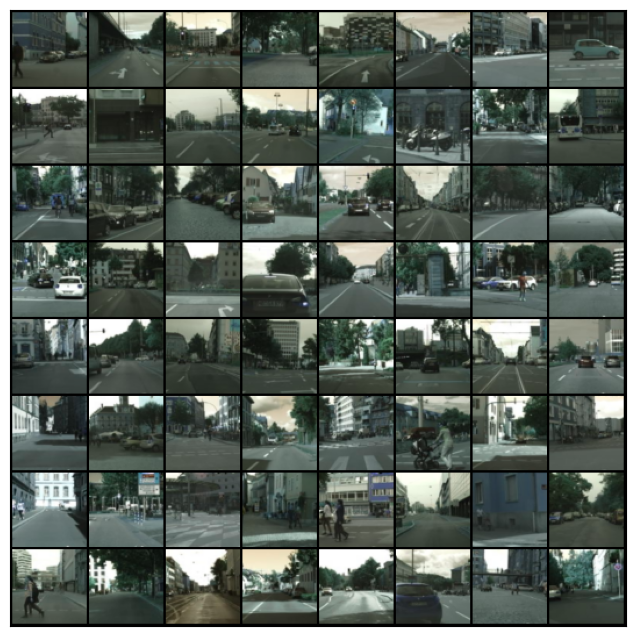

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


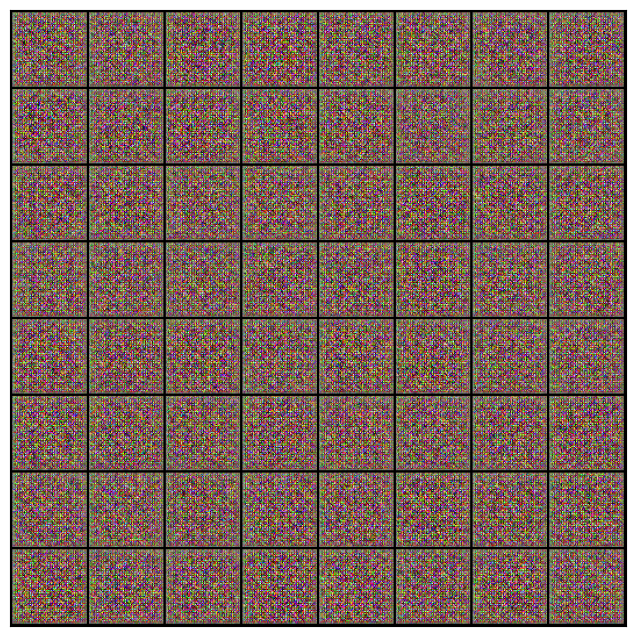

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


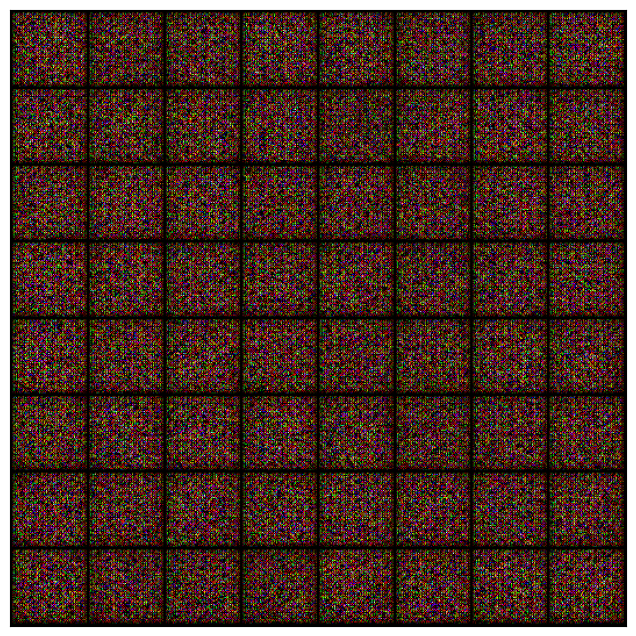

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 500

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [1/500], loss_g: 14.1739, loss_d: 1.0108, real_score: 0.9887, fake_score: 0.6201
Saving generated-images-0001.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [2/500], loss_g: 12.3173, loss_d: 0.0524, real_score: 0.9504, fake_score: 0.0000
Saving generated-images-0002.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [3/500], loss_g: 9.7548, loss_d: 1.4902, real_score: 0.9740, fake_score: 0.7640
Saving generated-images-0003.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [4/500], loss_g: 5.6925, loss_d: 0.8859, real_score: 0.9433, fake_score: 0.5387
Saving generated-images-0004.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [5/500], loss_g: 1.0663, loss_d: 0.7815, real_score: 0.5684, fake_score: 0.0170
Saving generated-images-0005.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [6/500], loss_g: 2.5685, loss_d: 0.7431, real_score: 0.5742, fake_score: 0.1112
Saving generated-images-0006.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [7/500], loss_g: 3.0835, loss_d: 0.7415, real_score: 0.7623, fake_score: 0.3383
Saving generated-images-0007.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [8/500], loss_g: 2.5295, loss_d: 0.7172, real_score: 0.6851, fake_score: 0.2444
Saving generated-images-0008.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [9/500], loss_g: 3.0804, loss_d: 0.4265, real_score: 0.7853, fake_score: 0.1408
Saving generated-images-0009.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [10/500], loss_g: 2.5136, loss_d: 0.6983, real_score: 0.6228, fake_score: 0.1500
Saving generated-images-0010.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [11/500], loss_g: 3.5593, loss_d: 0.4785, real_score: 0.7867, fake_score: 0.1873
Saving generated-images-0011.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [12/500], loss_g: 3.2014, loss_d: 0.3930, real_score: 0.8483, fake_score: 0.1808
Saving generated-images-0012.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [13/500], loss_g: 6.3137, loss_d: 0.9173, real_score: 0.9238, fake_score: 0.5377
Saving generated-images-0013.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [14/500], loss_g: 5.8214, loss_d: 0.5033, real_score: 0.9413, fake_score: 0.3348
Saving generated-images-0014.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [15/500], loss_g: 4.6278, loss_d: 0.5499, real_score: 0.9453, fake_score: 0.3645
Saving generated-images-0015.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [16/500], loss_g: 3.4338, loss_d: 0.4157, real_score: 0.7773, fake_score: 0.1255
Saving generated-images-0016.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [17/500], loss_g: 3.8843, loss_d: 0.3874, real_score: 0.8085, fake_score: 0.1302
Saving generated-images-0017.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [18/500], loss_g: 2.3034, loss_d: 0.6544, real_score: 0.6399, fake_score: 0.1073
Saving generated-images-0018.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [19/500], loss_g: 3.1101, loss_d: 0.5635, real_score: 0.8552, fake_score: 0.3052
Saving generated-images-0019.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [20/500], loss_g: 3.6312, loss_d: 0.8680, real_score: 0.4689, fake_score: 0.0066
Saving generated-images-0020.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [21/500], loss_g: 3.6187, loss_d: 0.4256, real_score: 0.7732, fake_score: 0.1191
Saving generated-images-0021.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [22/500], loss_g: 4.2435, loss_d: 0.7535, real_score: 0.9812, fake_score: 0.4820
Saving generated-images-0022.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [23/500], loss_g: 6.7346, loss_d: 0.4877, real_score: 0.9096, fake_score: 0.3092
Saving generated-images-0023.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [24/500], loss_g: 3.7175, loss_d: 0.2773, real_score: 0.9375, fake_score: 0.1799
Saving generated-images-0024.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [25/500], loss_g: 3.7616, loss_d: 0.4937, real_score: 0.6670, fake_score: 0.0233
Saving generated-images-0025.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [26/500], loss_g: 3.1642, loss_d: 0.4030, real_score: 0.7986, fake_score: 0.1287
Saving generated-images-0026.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [27/500], loss_g: 3.6548, loss_d: 1.1836, real_score: 0.3768, fake_score: 0.0094
Saving generated-images-0027.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [28/500], loss_g: 7.3086, loss_d: 0.7278, real_score: 0.9370, fake_score: 0.4503
Saving generated-images-0028.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [29/500], loss_g: 3.3110, loss_d: 0.3491, real_score: 0.8123, fake_score: 0.1060
Saving generated-images-0029.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [30/500], loss_g: 4.6240, loss_d: 0.5623, real_score: 0.9547, fake_score: 0.3746
Saving generated-images-0030.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [31/500], loss_g: 4.6436, loss_d: 0.4418, real_score: 0.8664, fake_score: 0.2435
Saving generated-images-0031.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [32/500], loss_g: 4.7875, loss_d: 0.4851, real_score: 0.9135, fake_score: 0.2952
Saving generated-images-0032.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [33/500], loss_g: 3.9396, loss_d: 0.4376, real_score: 0.8050, fake_score: 0.1445
Saving generated-images-0033.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [34/500], loss_g: 3.5877, loss_d: 0.6150, real_score: 0.7287, fake_score: 0.2103
Saving generated-images-0034.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [35/500], loss_g: 3.1298, loss_d: 0.3911, real_score: 0.8219, fake_score: 0.1586
Saving generated-images-0035.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [36/500], loss_g: 3.6148, loss_d: 0.3901, real_score: 0.8519, fake_score: 0.1795
Saving generated-images-0036.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [37/500], loss_g: 5.6628, loss_d: 0.4495, real_score: 0.9078, fake_score: 0.2704
Saving generated-images-0037.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [38/500], loss_g: 2.0388, loss_d: 0.9876, real_score: 0.4415, fake_score: 0.0279
Saving generated-images-0038.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [39/500], loss_g: 3.9298, loss_d: 0.4256, real_score: 0.7267, fake_score: 0.0306
Saving generated-images-0039.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [40/500], loss_g: 4.9717, loss_d: 0.3240, real_score: 0.7595, fake_score: 0.0118
Saving generated-images-0040.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [41/500], loss_g: 4.7170, loss_d: 0.4481, real_score: 0.8699, fake_score: 0.2358
Saving generated-images-0041.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [42/500], loss_g: 4.0046, loss_d: 0.3258, real_score: 0.7829, fake_score: 0.0466
Saving generated-images-0042.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [43/500], loss_g: 2.5533, loss_d: 2.2966, real_score: 0.1604, fake_score: 0.0051
Saving generated-images-0043.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [44/500], loss_g: 2.4898, loss_d: 0.4827, real_score: 0.7318, fake_score: 0.1108
Saving generated-images-0044.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [45/500], loss_g: 3.5148, loss_d: 0.2912, real_score: 0.7986, fake_score: 0.0456
Saving generated-images-0045.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [46/500], loss_g: 2.7512, loss_d: 0.9208, real_score: 0.4789, fake_score: 0.0252
Saving generated-images-0046.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [47/500], loss_g: 2.2216, loss_d: 1.5338, real_score: 0.2809, fake_score: 0.0077
Saving generated-images-0047.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [48/500], loss_g: 4.4469, loss_d: 0.3156, real_score: 0.9269, fake_score: 0.2003
Saving generated-images-0048.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [49/500], loss_g: 2.3259, loss_d: 0.6454, real_score: 0.6206, fake_score: 0.0839
Saving generated-images-0049.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [50/500], loss_g: 4.5057, loss_d: 0.7569, real_score: 0.9403, fake_score: 0.4624
Saving generated-images-0050.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [51/500], loss_g: 2.9810, loss_d: 0.5631, real_score: 0.6264, fake_score: 0.0272
Saving generated-images-0051.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [52/500], loss_g: 6.1436, loss_d: 0.4919, real_score: 0.9721, fake_score: 0.3432
Saving generated-images-0052.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [53/500], loss_g: 4.8661, loss_d: 0.8758, real_score: 0.9751, fake_score: 0.4979
Saving generated-images-0053.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [54/500], loss_g: 2.6191, loss_d: 1.0050, real_score: 0.4202, fake_score: 0.0101
Saving generated-images-0054.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [55/500], loss_g: 3.4091, loss_d: 0.3046, real_score: 0.9265, fake_score: 0.1811
Saving generated-images-0055.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [56/500], loss_g: 4.7391, loss_d: 0.2875, real_score: 0.9394, fake_score: 0.1896
Saving generated-images-0056.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [57/500], loss_g: 2.4168, loss_d: 0.5209, real_score: 0.7200, fake_score: 0.1285
Saving generated-images-0057.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [58/500], loss_g: 3.8805, loss_d: 0.7928, real_score: 0.9683, fake_score: 0.4998
Saving generated-images-0058.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [59/500], loss_g: 2.9899, loss_d: 0.4813, real_score: 0.7283, fake_score: 0.1186
Saving generated-images-0059.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [60/500], loss_g: 3.2509, loss_d: 0.2837, real_score: 0.8744, fake_score: 0.1258
Saving generated-images-0060.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [61/500], loss_g: 5.4839, loss_d: 0.5066, real_score: 0.9815, fake_score: 0.3494
Saving generated-images-0061.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [62/500], loss_g: 3.1905, loss_d: 0.6837, real_score: 0.5888, fake_score: 0.0354
Saving generated-images-0062.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [63/500], loss_g: 5.4878, loss_d: 0.4636, real_score: 0.9753, fake_score: 0.3321
Saving generated-images-0063.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [64/500], loss_g: 3.0237, loss_d: 0.1011, real_score: 0.9555, fake_score: 0.0455
Saving generated-images-0064.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [65/500], loss_g: 7.7792, loss_d: 1.2767, real_score: 0.9631, fake_score: 0.6520
Saving generated-images-0065.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [66/500], loss_g: 2.3909, loss_d: 0.6285, real_score: 0.7073, fake_score: 0.1888
Saving generated-images-0066.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [67/500], loss_g: 6.2853, loss_d: 0.7650, real_score: 0.9797, fake_score: 0.4815
Saving generated-images-0067.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [68/500], loss_g: 4.2563, loss_d: 0.4063, real_score: 0.8257, fake_score: 0.1794
Saving generated-images-0068.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [69/500], loss_g: 3.1366, loss_d: 0.5373, real_score: 0.7458, fake_score: 0.1686
Saving generated-images-0069.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [70/500], loss_g: 5.2310, loss_d: 0.4547, real_score: 0.9564, fake_score: 0.3090
Saving generated-images-0070.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [71/500], loss_g: 3.1610, loss_d: 0.3026, real_score: 0.7998, fake_score: 0.0434
Saving generated-images-0071.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [72/500], loss_g: 2.2081, loss_d: 0.7525, real_score: 0.5664, fake_score: 0.1094
Saving generated-images-0072.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [73/500], loss_g: 3.7982, loss_d: 0.3257, real_score: 0.8611, fake_score: 0.1447
Saving generated-images-0073.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [74/500], loss_g: 2.5363, loss_d: 1.0557, real_score: 0.4362, fake_score: 0.0189
Saving generated-images-0074.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [75/500], loss_g: 2.5482, loss_d: 0.5685, real_score: 0.6747, fake_score: 0.0921
Saving generated-images-0075.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [76/500], loss_g: 3.6836, loss_d: 0.2830, real_score: 0.8219, fake_score: 0.0695
Saving generated-images-0076.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [77/500], loss_g: 2.6954, loss_d: 0.3199, real_score: 0.8076, fake_score: 0.0706
Saving generated-images-0077.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [78/500], loss_g: 4.8739, loss_d: 0.1835, real_score: 0.9540, fake_score: 0.1183
Saving generated-images-0078.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [79/500], loss_g: 3.3127, loss_d: 0.3764, real_score: 0.8180, fake_score: 0.1320
Saving generated-images-0079.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [80/500], loss_g: 10.5337, loss_d: 1.9715, real_score: 0.9936, fake_score: 0.7989
Saving generated-images-0080.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [81/500], loss_g: 3.3337, loss_d: 0.3437, real_score: 0.7647, fake_score: 0.0465
Saving generated-images-0081.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [82/500], loss_g: 3.8347, loss_d: 0.2744, real_score: 0.8702, fake_score: 0.1108
Saving generated-images-0082.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [83/500], loss_g: 4.2653, loss_d: 0.2424, real_score: 0.8294, fake_score: 0.0445
Saving generated-images-0083.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [84/500], loss_g: 1.7735, loss_d: 0.4555, real_score: 0.7053, fake_score: 0.0535
Saving generated-images-0084.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [85/500], loss_g: 3.3643, loss_d: 0.2020, real_score: 0.9373, fake_score: 0.1165
Saving generated-images-0085.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [86/500], loss_g: 5.5764, loss_d: 0.4374, real_score: 0.9844, fake_score: 0.3098
Saving generated-images-0086.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [87/500], loss_g: 4.0597, loss_d: 0.3112, real_score: 0.8980, fake_score: 0.1644
Saving generated-images-0087.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [88/500], loss_g: 5.4493, loss_d: 0.3540, real_score: 0.9594, fake_score: 0.2358
Saving generated-images-0088.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [89/500], loss_g: 3.8974, loss_d: 3.1771, real_score: 0.0683, fake_score: 0.0004
Saving generated-images-0089.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [90/500], loss_g: 4.4548, loss_d: 0.4692, real_score: 0.9571, fake_score: 0.3213
Saving generated-images-0090.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [91/500], loss_g: 3.7541, loss_d: 0.3444, real_score: 0.8916, fake_score: 0.1901
Saving generated-images-0091.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [92/500], loss_g: 1.9331, loss_d: 0.5360, real_score: 0.6642, fake_score: 0.0376
Saving generated-images-0092.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [93/500], loss_g: 1.7660, loss_d: 0.7884, real_score: 0.5186, fake_score: 0.0124
Saving generated-images-0093.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [94/500], loss_g: 3.6950, loss_d: 0.6589, real_score: 0.5673, fake_score: 0.0054
Saving generated-images-0094.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [95/500], loss_g: 7.0909, loss_d: 0.4029, real_score: 0.9666, fake_score: 0.2866
Saving generated-images-0095.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [96/500], loss_g: 3.5277, loss_d: 0.3198, real_score: 0.8164, fake_score: 0.0768
Saving generated-images-0096.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [97/500], loss_g: 6.8268, loss_d: 0.5370, real_score: 0.9923, fake_score: 0.3686
Saving generated-images-0097.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [98/500], loss_g: 4.9483, loss_d: 0.2191, real_score: 0.9361, fake_score: 0.1345
Saving generated-images-0098.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [99/500], loss_g: 3.9452, loss_d: 0.1595, real_score: 0.9476, fake_score: 0.0923
Saving generated-images-0099.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [100/500], loss_g: 4.7203, loss_d: 0.2027, real_score: 0.9504, fake_score: 0.1303
Saving generated-images-0100.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [101/500], loss_g: 4.8162, loss_d: 0.2612, real_score: 0.8044, fake_score: 0.0194
Saving generated-images-0101.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [102/500], loss_g: 0.9638, loss_d: 0.6154, real_score: 0.6311, fake_score: 0.0481
Saving generated-images-0102.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [103/500], loss_g: 4.4073, loss_d: 0.9395, real_score: 0.4423, fake_score: 0.0044
Saving generated-images-0103.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [104/500], loss_g: 2.6938, loss_d: 0.4053, real_score: 0.8124, fake_score: 0.1424
Saving generated-images-0104.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [105/500], loss_g: 4.4594, loss_d: 0.1566, real_score: 0.9691, fake_score: 0.1125
Saving generated-images-0105.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [106/500], loss_g: 4.8516, loss_d: 0.1612, real_score: 0.9662, fake_score: 0.1132
Saving generated-images-0106.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [107/500], loss_g: 4.7695, loss_d: 0.1456, real_score: 0.9611, fake_score: 0.0944
Saving generated-images-0107.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [108/500], loss_g: 4.2821, loss_d: 0.2406, real_score: 0.9695, fake_score: 0.1741
Saving generated-images-0108.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [109/500], loss_g: 9.3256, loss_d: 0.9479, real_score: 0.9956, fake_score: 0.5395
Saving generated-images-0109.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [110/500], loss_g: 5.3821, loss_d: 0.1529, real_score: 0.9765, fake_score: 0.1139
Saving generated-images-0110.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [111/500], loss_g: 3.7945, loss_d: 0.2563, real_score: 0.8888, fake_score: 0.1142
Saving generated-images-0111.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [112/500], loss_g: 5.3656, loss_d: 4.5046, real_score: 0.0193, fake_score: 0.0001
Saving generated-images-0112.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [113/500], loss_g: 4.3368, loss_d: 0.3276, real_score: 0.8911, fake_score: 0.1680
Saving generated-images-0113.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [114/500], loss_g: 3.5233, loss_d: 0.4514, real_score: 0.7930, fake_score: 0.1611
Saving generated-images-0114.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [115/500], loss_g: 4.0052, loss_d: 0.2635, real_score: 0.8305, fake_score: 0.0569
Saving generated-images-0115.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [116/500], loss_g: 3.2750, loss_d: 0.2277, real_score: 0.8927, fake_score: 0.0960
Saving generated-images-0116.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [117/500], loss_g: 4.0846, loss_d: 0.1624, real_score: 0.9445, fake_score: 0.0939
Saving generated-images-0117.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [118/500], loss_g: 7.1871, loss_d: 0.4596, real_score: 0.9870, fake_score: 0.3322
Saving generated-images-0118.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [119/500], loss_g: 2.3257, loss_d: 0.4225, real_score: 0.7182, fake_score: 0.0251
Saving generated-images-0119.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [120/500], loss_g: 2.8162, loss_d: 0.2476, real_score: 0.8195, fake_score: 0.0313
Saving generated-images-0120.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [121/500], loss_g: 3.8226, loss_d: 0.3449, real_score: 0.8446, fake_score: 0.1309
Saving generated-images-0121.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [122/500], loss_g: 5.0007, loss_d: 0.2780, real_score: 0.9237, fake_score: 0.1614
Saving generated-images-0122.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [123/500], loss_g: 4.6258, loss_d: 0.1815, real_score: 0.8884, fake_score: 0.0446
Saving generated-images-0123.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [124/500], loss_g: 3.5304, loss_d: 0.2601, real_score: 0.8584, fake_score: 0.0892
Saving generated-images-0124.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [125/500], loss_g: 2.7868, loss_d: 0.3092, real_score: 0.8315, fake_score: 0.0992
Saving generated-images-0125.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [126/500], loss_g: 4.9583, loss_d: 0.3519, real_score: 0.9500, fake_score: 0.2335
Saving generated-images-0126.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [127/500], loss_g: 2.5888, loss_d: 0.3840, real_score: 0.7551, fake_score: 0.0272
Saving generated-images-0127.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [128/500], loss_g: 4.0442, loss_d: 0.2331, real_score: 0.9077, fake_score: 0.1134
Saving generated-images-0128.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [129/500], loss_g: 3.9944, loss_d: 0.3221, real_score: 0.8840, fake_score: 0.1569
Saving generated-images-0129.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [130/500], loss_g: 2.6811, loss_d: 0.6771, real_score: 0.5758, fake_score: 0.0038
Saving generated-images-0130.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [131/500], loss_g: 2.4301, loss_d: 1.2763, real_score: 0.3553, fake_score: 0.0012
Saving generated-images-0131.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [132/500], loss_g: 5.1784, loss_d: 0.4122, real_score: 0.9800, fake_score: 0.2780
Saving generated-images-0132.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [133/500], loss_g: 4.7400, loss_d: 0.1381, real_score: 0.9666, fake_score: 0.0917
Saving generated-images-0133.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [134/500], loss_g: 7.4416, loss_d: 0.2850, real_score: 0.9829, fake_score: 0.2150
Saving generated-images-0134.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [135/500], loss_g: 4.5667, loss_d: 0.4066, real_score: 0.8281, fake_score: 0.1650
Saving generated-images-0135.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [136/500], loss_g: 4.4309, loss_d: 0.2844, real_score: 0.8954, fake_score: 0.1405
Saving generated-images-0136.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [137/500], loss_g: 4.7887, loss_d: 0.2324, real_score: 0.9565, fake_score: 0.1547
Saving generated-images-0137.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [138/500], loss_g: 4.6602, loss_d: 0.3385, real_score: 0.9367, fake_score: 0.2038
Saving generated-images-0138.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [139/500], loss_g: 3.8078, loss_d: 0.1401, real_score: 0.9465, fake_score: 0.0771
Saving generated-images-0139.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [140/500], loss_g: 9.6138, loss_d: 0.6028, real_score: 0.9878, fake_score: 0.3861
Saving generated-images-0140.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [141/500], loss_g: 4.1456, loss_d: 0.3051, real_score: 0.8625, fake_score: 0.1136
Saving generated-images-0141.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [142/500], loss_g: 6.4362, loss_d: 0.4096, real_score: 0.9696, fake_score: 0.2812
Saving generated-images-0142.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [143/500], loss_g: 5.6964, loss_d: 0.1886, real_score: 0.9564, fake_score: 0.1234
Saving generated-images-0143.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [144/500], loss_g: 5.2559, loss_d: 0.2095, real_score: 0.9509, fake_score: 0.1350
Saving generated-images-0144.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [145/500], loss_g: 2.6244, loss_d: 0.2829, real_score: 0.8002, fake_score: 0.0252
Saving generated-images-0145.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [146/500], loss_g: 5.4904, loss_d: 0.2241, real_score: 0.9611, fake_score: 0.1517
Saving generated-images-0146.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [147/500], loss_g: 3.0313, loss_d: 0.2629, real_score: 0.8021, fake_score: 0.0184
Saving generated-images-0147.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [148/500], loss_g: 5.3252, loss_d: 0.3467, real_score: 0.9121, fake_score: 0.1947
Saving generated-images-0148.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [149/500], loss_g: 4.9120, loss_d: 0.0957, real_score: 0.9451, fake_score: 0.0357
Saving generated-images-0149.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [150/500], loss_g: 3.5608, loss_d: 0.2355, real_score: 0.9939, fake_score: 0.1814
Saving generated-images-0150.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [151/500], loss_g: 5.4005, loss_d: 0.2092, real_score: 0.9769, fake_score: 0.1581
Saving generated-images-0151.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [152/500], loss_g: 5.5396, loss_d: 0.1659, real_score: 0.8717, fake_score: 0.0200
Saving generated-images-0152.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [153/500], loss_g: 4.2945, loss_d: 0.1535, real_score: 0.9357, fake_score: 0.0779
Saving generated-images-0153.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [154/500], loss_g: 4.0992, loss_d: 0.1675, real_score: 0.8747, fake_score: 0.0268
Saving generated-images-0154.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [155/500], loss_g: 10.7393, loss_d: 2.9476, real_score: 0.9996, fake_score: 0.8370
Saving generated-images-0155.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [156/500], loss_g: 5.3427, loss_d: 0.4557, real_score: 0.9074, fake_score: 0.2650
Saving generated-images-0156.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [157/500], loss_g: 5.7839, loss_d: 0.2837, real_score: 0.9737, fake_score: 0.2035
Saving generated-images-0157.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [158/500], loss_g: 4.4888, loss_d: 0.1784, real_score: 0.9693, fake_score: 0.1226
Saving generated-images-0158.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [159/500], loss_g: 3.2258, loss_d: 0.1597, real_score: 0.9014, fake_score: 0.0449
Saving generated-images-0159.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [160/500], loss_g: 5.4973, loss_d: 0.1263, real_score: 0.9750, fake_score: 0.0891
Saving generated-images-0160.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [161/500], loss_g: 3.0160, loss_d: 0.1226, real_score: 0.9117, fake_score: 0.0252
Saving generated-images-0161.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [162/500], loss_g: 4.3900, loss_d: 0.0755, real_score: 0.9688, fake_score: 0.0414
Saving generated-images-0162.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [163/500], loss_g: 4.5105, loss_d: 0.3509, real_score: 0.9200, fake_score: 0.2072
Saving generated-images-0163.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [164/500], loss_g: 4.4445, loss_d: 0.1904, real_score: 0.9629, fake_score: 0.1318
Saving generated-images-0164.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [165/500], loss_g: 3.3273, loss_d: 0.2081, real_score: 0.8530, fake_score: 0.0334
Saving generated-images-0165.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [166/500], loss_g: 3.9622, loss_d: 0.1957, real_score: 0.8968, fake_score: 0.0691
Saving generated-images-0166.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [167/500], loss_g: 3.1429, loss_d: 0.1837, real_score: 0.9912, fake_score: 0.1419
Saving generated-images-0167.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [168/500], loss_g: 3.7855, loss_d: 0.1638, real_score: 0.9516, fake_score: 0.1001
Saving generated-images-0168.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [169/500], loss_g: 3.4806, loss_d: 0.2109, real_score: 0.9529, fake_score: 0.1374
Saving generated-images-0169.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [170/500], loss_g: 3.8989, loss_d: 0.1386, real_score: 0.9308, fake_score: 0.0600
Saving generated-images-0170.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [171/500], loss_g: 3.5821, loss_d: 0.1423, real_score: 0.9196, fake_score: 0.0512
Saving generated-images-0171.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [172/500], loss_g: 4.8775, loss_d: 0.0963, real_score: 0.9484, fake_score: 0.0400
Saving generated-images-0172.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [173/500], loss_g: 7.9724, loss_d: 0.2746, real_score: 0.9959, fake_score: 0.2094
Saving generated-images-0173.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [174/500], loss_g: 2.2557, loss_d: 0.3068, real_score: 0.8047, fake_score: 0.0636
Saving generated-images-0174.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [175/500], loss_g: 6.7688, loss_d: 0.4539, real_score: 0.9778, fake_score: 0.3084
Saving generated-images-0175.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [176/500], loss_g: 5.1926, loss_d: 0.1407, real_score: 0.9743, fake_score: 0.1010
Saving generated-images-0176.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [177/500], loss_g: 7.6626, loss_d: 0.9611, real_score: 0.9988, fake_score: 0.5284
Saving generated-images-0177.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [178/500], loss_g: 4.4883, loss_d: 0.1807, real_score: 0.9248, fake_score: 0.0896
Saving generated-images-0178.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [179/500], loss_g: 6.1736, loss_d: 0.2017, real_score: 0.9951, fake_score: 0.1659
Saving generated-images-0179.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [180/500], loss_g: 6.7536, loss_d: 0.2011, real_score: 0.9971, fake_score: 0.1621
Saving generated-images-0180.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [181/500], loss_g: 3.6320, loss_d: 0.0837, real_score: 0.9541, fake_score: 0.0334
Saving generated-images-0181.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [182/500], loss_g: 5.1255, loss_d: 0.1111, real_score: 0.9679, fake_score: 0.0708
Saving generated-images-0182.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [183/500], loss_g: 14.9177, loss_d: 3.3557, real_score: 1.0000, fake_score: 0.9024
Saving generated-images-0183.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [184/500], loss_g: 4.9952, loss_d: 0.6316, real_score: 0.5995, fake_score: 0.0096
Saving generated-images-0184.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [185/500], loss_g: 2.2819, loss_d: 0.8236, real_score: 0.5399, fake_score: 0.0034
Saving generated-images-0185.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [186/500], loss_g: 4.9744, loss_d: 0.2012, real_score: 0.9339, fake_score: 0.1117
Saving generated-images-0186.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [187/500], loss_g: 2.7176, loss_d: 0.2799, real_score: 0.8658, fake_score: 0.1060
Saving generated-images-0187.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [188/500], loss_g: 3.8375, loss_d: 0.2366, real_score: 0.9019, fake_score: 0.1056
Saving generated-images-0188.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [189/500], loss_g: 2.6531, loss_d: 0.2184, real_score: 0.8712, fake_score: 0.0532
Saving generated-images-0189.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [190/500], loss_g: 3.8423, loss_d: 0.1531, real_score: 0.9007, fake_score: 0.0383
Saving generated-images-0190.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [191/500], loss_g: 6.4264, loss_d: 0.6284, real_score: 0.9994, fake_score: 0.3577
Saving generated-images-0191.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [192/500], loss_g: 4.3439, loss_d: 0.2118, real_score: 0.9778, fake_score: 0.1560
Saving generated-images-0192.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [193/500], loss_g: 4.1182, loss_d: 0.0811, real_score: 0.9569, fake_score: 0.0348
Saving generated-images-0193.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [194/500], loss_g: 4.1764, loss_d: 0.0909, real_score: 0.9356, fake_score: 0.0205
Saving generated-images-0194.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [195/500], loss_g: 4.4982, loss_d: 0.1283, real_score: 0.9587, fake_score: 0.0782
Saving generated-images-0195.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [196/500], loss_g: 3.3409, loss_d: 0.1809, real_score: 0.8829, fake_score: 0.0459
Saving generated-images-0196.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [197/500], loss_g: 5.6274, loss_d: 0.1069, real_score: 0.9838, fake_score: 0.0809
Saving generated-images-0197.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [198/500], loss_g: 4.8776, loss_d: 0.2987, real_score: 0.8556, fake_score: 0.1092
Saving generated-images-0198.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [199/500], loss_g: 3.9057, loss_d: 0.1330, real_score: 0.9297, fake_score: 0.0525
Saving generated-images-0199.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [200/500], loss_g: 4.6367, loss_d: 0.1125, real_score: 0.9323, fake_score: 0.0333
Saving generated-images-0200.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [201/500], loss_g: 3.7553, loss_d: 0.1141, real_score: 0.9320, fake_score: 0.0392
Saving generated-images-0201.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [202/500], loss_g: 3.5916, loss_d: 0.1007, real_score: 0.9242, fake_score: 0.0193
Saving generated-images-0202.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [203/500], loss_g: 6.1304, loss_d: 0.3050, real_score: 0.9553, fake_score: 0.1969
Saving generated-images-0203.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [204/500], loss_g: 3.5492, loss_d: 0.1840, real_score: 0.8763, fake_score: 0.0327
Saving generated-images-0204.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [205/500], loss_g: 0.7419, loss_d: 0.8015, real_score: 0.5060, fake_score: 0.0033
Saving generated-images-0205.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [206/500], loss_g: 4.8756, loss_d: 0.2486, real_score: 0.9053, fake_score: 0.1196
Saving generated-images-0206.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [207/500], loss_g: 4.2587, loss_d: 0.1222, real_score: 0.9361, fake_score: 0.0500
Saving generated-images-0207.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [208/500], loss_g: 4.9215, loss_d: 0.0742, real_score: 0.9807, fake_score: 0.0511
Saving generated-images-0208.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [209/500], loss_g: 3.9943, loss_d: 0.1163, real_score: 0.9369, fake_score: 0.0465
Saving generated-images-0209.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [210/500], loss_g: 5.3360, loss_d: 0.0509, real_score: 0.9700, fake_score: 0.0189
Saving generated-images-0210.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [211/500], loss_g: 3.8448, loss_d: 0.1275, real_score: 0.9220, fake_score: 0.0397
Saving generated-images-0211.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [212/500], loss_g: 4.3576, loss_d: 0.1317, real_score: 0.9360, fake_score: 0.0551
Saving generated-images-0212.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [213/500], loss_g: 4.7189, loss_d: 0.1023, real_score: 0.9860, fake_score: 0.0790
Saving generated-images-0213.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [214/500], loss_g: 5.3133, loss_d: 0.1244, real_score: 0.9795, fake_score: 0.0889
Saving generated-images-0214.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [215/500], loss_g: 2.0128, loss_d: 0.2287, real_score: 0.8264, fake_score: 0.0221
Saving generated-images-0215.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [216/500], loss_g: 2.8255, loss_d: 0.3068, real_score: 0.8378, fake_score: 0.0929
Saving generated-images-0216.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [217/500], loss_g: 4.8991, loss_d: 0.1722, real_score: 0.9628, fake_score: 0.1121
Saving generated-images-0217.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [218/500], loss_g: 6.0966, loss_d: 0.1315, real_score: 0.9810, fake_score: 0.0999
Saving generated-images-0218.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [219/500], loss_g: 3.6864, loss_d: 0.0966, real_score: 0.9552, fake_score: 0.0442
Saving generated-images-0219.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [220/500], loss_g: 4.5523, loss_d: 0.0441, real_score: 0.9824, fake_score: 0.0252
Saving generated-images-0220.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [221/500], loss_g: 5.5482, loss_d: 0.0748, real_score: 0.9793, fake_score: 0.0490
Saving generated-images-0221.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [222/500], loss_g: 4.5089, loss_d: 0.1383, real_score: 0.9422, fake_score: 0.0660
Saving generated-images-0222.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [223/500], loss_g: 4.4717, loss_d: 0.0487, real_score: 0.9737, fake_score: 0.0212
Saving generated-images-0223.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [224/500], loss_g: 2.0709, loss_d: 0.2290, real_score: 0.8159, fake_score: 0.0126
Saving generated-images-0224.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [225/500], loss_g: 7.0762, loss_d: 0.8017, real_score: 0.9866, fake_score: 0.4536
Saving generated-images-0225.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [226/500], loss_g: 3.9392, loss_d: 0.0860, real_score: 0.9623, fake_score: 0.0435
Saving generated-images-0226.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [227/500], loss_g: 4.7728, loss_d: 0.0304, real_score: 0.9866, fake_score: 0.0165
Saving generated-images-0227.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [228/500], loss_g: 4.0910, loss_d: 0.1115, real_score: 0.9487, fake_score: 0.0541
Saving generated-images-0228.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [229/500], loss_g: 3.1987, loss_d: 0.1407, real_score: 0.9090, fake_score: 0.0375
Saving generated-images-0229.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [230/500], loss_g: 4.9096, loss_d: 0.2037, real_score: 0.9603, fake_score: 0.1277
Saving generated-images-0230.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [231/500], loss_g: 5.5914, loss_d: 0.3566, real_score: 0.9759, fake_score: 0.2427
Saving generated-images-0231.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [232/500], loss_g: 5.1747, loss_d: 0.1586, real_score: 0.9678, fake_score: 0.1060
Saving generated-images-0232.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [233/500], loss_g: 5.7123, loss_d: 0.1619, real_score: 0.9698, fake_score: 0.1157
Saving generated-images-0233.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [234/500], loss_g: 3.3507, loss_d: 0.2587, real_score: 0.8980, fake_score: 0.1024
Saving generated-images-0234.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [235/500], loss_g: 4.7936, loss_d: 0.2301, real_score: 0.9236, fake_score: 0.1167
Saving generated-images-0235.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [236/500], loss_g: 2.8497, loss_d: 0.1918, real_score: 0.8614, fake_score: 0.0279
Saving generated-images-0236.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [237/500], loss_g: 5.2044, loss_d: 0.0510, real_score: 0.9886, fake_score: 0.0378
Saving generated-images-0237.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [238/500], loss_g: 4.0355, loss_d: 0.1214, real_score: 0.9113, fake_score: 0.0231
Saving generated-images-0238.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [239/500], loss_g: 5.1258, loss_d: 0.0433, real_score: 0.9828, fake_score: 0.0250
Saving generated-images-0239.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [240/500], loss_g: 4.8207, loss_d: 0.0613, real_score: 0.9576, fake_score: 0.0168
Saving generated-images-0240.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [241/500], loss_g: 4.5887, loss_d: 0.0824, real_score: 0.9430, fake_score: 0.0208
Saving generated-images-0241.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [242/500], loss_g: 4.1780, loss_d: 0.0708, real_score: 0.9560, fake_score: 0.0234
Saving generated-images-0242.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [243/500], loss_g: 4.1524, loss_d: 0.0658, real_score: 0.9753, fake_score: 0.0383
Saving generated-images-0243.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [244/500], loss_g: 3.9662, loss_d: 0.1189, real_score: 0.9349, fake_score: 0.0363
Saving generated-images-0244.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [245/500], loss_g: 4.4578, loss_d: 0.0663, real_score: 0.9555, fake_score: 0.0186
Saving generated-images-0245.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [246/500], loss_g: 3.7598, loss_d: 0.1008, real_score: 0.9469, fake_score: 0.0409
Saving generated-images-0246.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [247/500], loss_g: 1.7859, loss_d: 1.7402, real_score: 0.3891, fake_score: 0.1069
Saving generated-images-0247.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [248/500], loss_g: 5.6871, loss_d: 0.4328, real_score: 0.9087, fake_score: 0.2354
Saving generated-images-0248.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [249/500], loss_g: 8.2695, loss_d: 0.4971, real_score: 0.9950, fake_score: 0.3317
Saving generated-images-0249.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [250/500], loss_g: 5.4976, loss_d: 0.2698, real_score: 0.9603, fake_score: 0.1725
Saving generated-images-0250.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [251/500], loss_g: 4.8185, loss_d: 0.1438, real_score: 0.9622, fake_score: 0.0924
Saving generated-images-0251.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [252/500], loss_g: 4.7127, loss_d: 0.0944, real_score: 0.9357, fake_score: 0.0250
Saving generated-images-0252.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [253/500], loss_g: 4.0790, loss_d: 0.0773, real_score: 0.9620, fake_score: 0.0364
Saving generated-images-0253.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [254/500], loss_g: 4.8534, loss_d: 0.0966, real_score: 0.9799, fake_score: 0.0664
Saving generated-images-0254.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [255/500], loss_g: 4.9133, loss_d: 0.1199, real_score: 0.9563, fake_score: 0.0664
Saving generated-images-0255.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [256/500], loss_g: 5.3218, loss_d: 0.0794, real_score: 0.9910, fake_score: 0.0641
Saving generated-images-0256.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [257/500], loss_g: 4.4096, loss_d: 0.0801, real_score: 0.9584, fake_score: 0.0346
Saving generated-images-0257.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [258/500], loss_g: 4.9084, loss_d: 0.1196, real_score: 0.9627, fake_score: 0.0718
Saving generated-images-0258.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [259/500], loss_g: 1.8869, loss_d: 0.1405, real_score: 0.8881, fake_score: 0.0131
Saving generated-images-0259.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [260/500], loss_g: 3.3538, loss_d: 0.6507, real_score: 0.6747, fake_score: 0.1195
Saving generated-images-0260.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [261/500], loss_g: 4.3457, loss_d: 0.2059, real_score: 0.9141, fake_score: 0.0981
Saving generated-images-0261.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [262/500], loss_g: 4.3380, loss_d: 0.1529, real_score: 0.9444, fake_score: 0.0819
Saving generated-images-0262.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [263/500], loss_g: 5.0588, loss_d: 0.1192, real_score: 0.9891, fake_score: 0.0955
Saving generated-images-0263.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [264/500], loss_g: 4.2166, loss_d: 0.0996, real_score: 0.9508, fake_score: 0.0446
Saving generated-images-0264.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [265/500], loss_g: 4.0042, loss_d: 0.0903, real_score: 0.9347, fake_score: 0.0198
Saving generated-images-0265.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [266/500], loss_g: 3.7591, loss_d: 0.1099, real_score: 0.9496, fake_score: 0.0477
Saving generated-images-0266.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [267/500], loss_g: 4.9115, loss_d: 0.0897, real_score: 0.9727, fake_score: 0.0570
Saving generated-images-0267.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [268/500], loss_g: 4.8611, loss_d: 0.1178, real_score: 0.9824, fake_score: 0.0884
Saving generated-images-0268.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [269/500], loss_g: 3.9710, loss_d: 0.0808, real_score: 0.9468, fake_score: 0.0226
Saving generated-images-0269.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [270/500], loss_g: 4.8869, loss_d: 0.7121, real_score: 0.9014, fake_score: 0.3746
Saving generated-images-0270.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [271/500], loss_g: 3.3604, loss_d: 0.1717, real_score: 0.9229, fake_score: 0.0686
Saving generated-images-0271.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [272/500], loss_g: 5.3869, loss_d: 0.1566, real_score: 0.9794, fake_score: 0.1132
Saving generated-images-0272.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [273/500], loss_g: 3.5183, loss_d: 0.1140, real_score: 0.9278, fake_score: 0.0351
Saving generated-images-0273.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [274/500], loss_g: 4.1900, loss_d: 0.0670, real_score: 0.9639, fake_score: 0.0288
Saving generated-images-0274.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [275/500], loss_g: 4.6934, loss_d: 0.0900, real_score: 0.9744, fake_score: 0.0585
Saving generated-images-0275.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [276/500], loss_g: 4.2799, loss_d: 0.1982, real_score: 0.8379, fake_score: 0.0076
Saving generated-images-0276.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [277/500], loss_g: 5.3886, loss_d: 0.1131, real_score: 0.9734, fake_score: 0.0748
Saving generated-images-0277.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [278/500], loss_g: 4.4415, loss_d: 0.0531, real_score: 0.9714, fake_score: 0.0220
Saving generated-images-0278.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [279/500], loss_g: 4.0220, loss_d: 0.0664, real_score: 0.9537, fake_score: 0.0169
Saving generated-images-0279.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [280/500], loss_g: 4.0178, loss_d: 0.0571, real_score: 0.9746, fake_score: 0.0301
Saving generated-images-0280.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [281/500], loss_g: 5.0132, loss_d: 0.0465, real_score: 0.9652, fake_score: 0.0108
Saving generated-images-0281.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [282/500], loss_g: 4.1499, loss_d: 0.0532, real_score: 0.9715, fake_score: 0.0231
Saving generated-images-0282.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [283/500], loss_g: 4.9558, loss_d: 0.0418, real_score: 0.9746, fake_score: 0.0155
Saving generated-images-0283.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [284/500], loss_g: 4.3280, loss_d: 0.0715, real_score: 0.9703, fake_score: 0.0381
Saving generated-images-0284.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [285/500], loss_g: 5.3150, loss_d: 0.0345, real_score: 0.9861, fake_score: 0.0199
Saving generated-images-0285.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [286/500], loss_g: 0.8298, loss_d: 0.2420, real_score: 0.8048, fake_score: 0.0045
Saving generated-images-0286.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [287/500], loss_g: 3.1242, loss_d: 0.3393, real_score: 0.7753, fake_score: 0.0505
Saving generated-images-0287.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [288/500], loss_g: 4.0975, loss_d: 0.1570, real_score: 0.9151, fake_score: 0.0554
Saving generated-images-0288.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [289/500], loss_g: 4.8614, loss_d: 0.0990, real_score: 0.9636, fake_score: 0.0566
Saving generated-images-0289.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [290/500], loss_g: 4.6002, loss_d: 0.0824, real_score: 0.9784, fake_score: 0.0548
Saving generated-images-0290.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [291/500], loss_g: 4.3722, loss_d: 0.0662, real_score: 0.9719, fake_score: 0.0346
Saving generated-images-0291.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [292/500], loss_g: 3.1592, loss_d: 0.0984, real_score: 0.9295, fake_score: 0.0214
Saving generated-images-0292.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [293/500], loss_g: 5.9308, loss_d: 0.0806, real_score: 0.9854, fake_score: 0.0564
Saving generated-images-0293.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [294/500], loss_g: 5.2501, loss_d: 0.0585, real_score: 0.9854, fake_score: 0.0391
Saving generated-images-0294.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [295/500], loss_g: 5.8417, loss_d: 0.0494, real_score: 0.9903, fake_score: 0.0375
Saving generated-images-0295.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [296/500], loss_g: 0.9538, loss_d: 0.4161, real_score: 0.6838, fake_score: 0.0013
Saving generated-images-0296.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [297/500], loss_g: 4.4451, loss_d: 0.3314, real_score: 0.8700, fake_score: 0.1471
Saving generated-images-0297.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [298/500], loss_g: 3.7630, loss_d: 0.4022, real_score: 0.7129, fake_score: 0.0082
Saving generated-images-0298.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [299/500], loss_g: 4.9540, loss_d: 0.1496, real_score: 0.9502, fake_score: 0.0842
Saving generated-images-0299.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [300/500], loss_g: 5.1460, loss_d: 0.0942, real_score: 0.9603, fake_score: 0.0480
Saving generated-images-0300.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [301/500], loss_g: 5.2965, loss_d: 0.1004, real_score: 0.9741, fake_score: 0.0665
Saving generated-images-0301.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [302/500], loss_g: 2.9205, loss_d: 0.1873, real_score: 0.8526, fake_score: 0.0097
Saving generated-images-0302.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [303/500], loss_g: 4.5553, loss_d: 0.0533, real_score: 0.9644, fake_score: 0.0154
Saving generated-images-0303.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [304/500], loss_g: 5.7526, loss_d: 0.0668, real_score: 0.9881, fake_score: 0.0509
Saving generated-images-0304.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [305/500], loss_g: 3.9507, loss_d: 0.0919, real_score: 0.9523, fake_score: 0.0391
Saving generated-images-0305.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [306/500], loss_g: 5.7220, loss_d: 0.0648, real_score: 0.9516, fake_score: 0.0129
Saving generated-images-0306.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [307/500], loss_g: 5.3239, loss_d: 0.0543, real_score: 0.9748, fake_score: 0.0272
Saving generated-images-0307.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [308/500], loss_g: 6.0964, loss_d: 0.0457, real_score: 0.9965, fake_score: 0.0387
Saving generated-images-0308.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [309/500], loss_g: 4.3602, loss_d: 0.0523, real_score: 0.9649, fake_score: 0.0156
Saving generated-images-0309.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [310/500], loss_g: 1.7600, loss_d: 0.1111, real_score: 0.9145, fake_score: 0.0153
Saving generated-images-0310.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [311/500], loss_g: 1.7072, loss_d: 0.9663, real_score: 0.4923, fake_score: 0.0462
Saving generated-images-0311.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [312/500], loss_g: 1.9463, loss_d: 0.7094, real_score: 0.6080, fake_score: 0.0145
Saving generated-images-0312.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [313/500], loss_g: 5.9315, loss_d: 0.1267, real_score: 0.9362, fake_score: 0.0459
Saving generated-images-0313.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [314/500], loss_g: 5.5180, loss_d: 0.2277, real_score: 0.9643, fake_score: 0.1469
Saving generated-images-0314.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [315/500], loss_g: 3.0443, loss_d: 0.1598, real_score: 0.8920, fake_score: 0.0297
Saving generated-images-0315.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [316/500], loss_g: 5.6056, loss_d: 0.1747, real_score: 0.9526, fake_score: 0.0937
Saving generated-images-0316.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [317/500], loss_g: 4.8778, loss_d: 0.0887, real_score: 0.9524, fake_score: 0.0362
Saving generated-images-0317.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [318/500], loss_g: 5.9815, loss_d: 0.0818, real_score: 0.9895, fake_score: 0.0650
Saving generated-images-0318.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [319/500], loss_g: 4.4725, loss_d: 0.0927, real_score: 0.9326, fake_score: 0.0201
Saving generated-images-0319.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [320/500], loss_g: 5.1331, loss_d: 0.0634, real_score: 0.9481, fake_score: 0.0082
Saving generated-images-0320.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [321/500], loss_g: 4.4198, loss_d: 0.0651, real_score: 0.9579, fake_score: 0.0194
Saving generated-images-0321.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [322/500], loss_g: 4.5331, loss_d: 0.0574, real_score: 0.9687, fake_score: 0.0244
Saving generated-images-0322.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [323/500], loss_g: 4.6026, loss_d: 0.0566, real_score: 0.9605, fake_score: 0.0151
Saving generated-images-0323.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [324/500], loss_g: 5.2763, loss_d: 0.0513, real_score: 0.9843, fake_score: 0.0335
Saving generated-images-0324.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [325/500], loss_g: 5.6611, loss_d: 0.0728, real_score: 0.9905, fake_score: 0.0575
Saving generated-images-0325.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [326/500], loss_g: 3.3709, loss_d: 0.0701, real_score: 0.9426, fake_score: 0.0100
Saving generated-images-0326.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [327/500], loss_g: 4.8976, loss_d: 0.0418, real_score: 0.9808, fake_score: 0.0215
Saving generated-images-0327.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [328/500], loss_g: 4.5892, loss_d: 0.0480, real_score: 0.9794, fake_score: 0.0261
Saving generated-images-0328.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [329/500], loss_g: 4.6643, loss_d: 0.0323, real_score: 0.9824, fake_score: 0.0141
Saving generated-images-0329.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [330/500], loss_g: 4.9027, loss_d: 0.0364, real_score: 0.9851, fake_score: 0.0204
Saving generated-images-0330.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [331/500], loss_g: 5.1919, loss_d: 0.0249, real_score: 0.9885, fake_score: 0.0130
Saving generated-images-0331.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [332/500], loss_g: 8.5853, loss_d: 0.1852, real_score: 0.9979, fake_score: 0.1401
Saving generated-images-0332.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [333/500], loss_g: 4.6463, loss_d: 0.2262, real_score: 0.8392, fake_score: 0.0158
Saving generated-images-0333.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [334/500], loss_g: 3.8407, loss_d: 0.2092, real_score: 0.8665, fake_score: 0.0174
Saving generated-images-0334.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [335/500], loss_g: 5.1687, loss_d: 0.0426, real_score: 0.9754, fake_score: 0.0167
Saving generated-images-0335.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [336/500], loss_g: 5.7443, loss_d: 0.0631, real_score: 0.9894, fake_score: 0.0481
Saving generated-images-0336.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [337/500], loss_g: 4.2340, loss_d: 0.0606, real_score: 0.9541, fake_score: 0.0112
Saving generated-images-0337.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [338/500], loss_g: 2.8333, loss_d: 0.0755, real_score: 0.9380, fake_score: 0.0094
Saving generated-images-0338.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [339/500], loss_g: 4.4140, loss_d: 0.0786, real_score: 0.9392, fake_score: 0.0123
Saving generated-images-0339.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [340/500], loss_g: 5.3950, loss_d: 0.0277, real_score: 0.9837, fake_score: 0.0110
Saving generated-images-0340.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [341/500], loss_g: 5.3873, loss_d: 0.0473, real_score: 0.9840, fake_score: 0.0293
Saving generated-images-0341.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [342/500], loss_g: 5.7749, loss_d: 0.0410, real_score: 0.9805, fake_score: 0.0199
Saving generated-images-0342.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [343/500], loss_g: 5.9303, loss_d: 0.0388, real_score: 0.9935, fake_score: 0.0309
Saving generated-images-0343.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [344/500], loss_g: 4.1798, loss_d: 0.4793, real_score: 0.7609, fake_score: 0.0534
Saving generated-images-0344.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [345/500], loss_g: 6.1523, loss_d: 0.1001, real_score: 0.9542, fake_score: 0.0446
Saving generated-images-0345.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [346/500], loss_g: 5.0171, loss_d: 0.0958, real_score: 0.9445, fake_score: 0.0341
Saving generated-images-0346.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [347/500], loss_g: 6.2244, loss_d: 0.0608, real_score: 0.9793, fake_score: 0.0368
Saving generated-images-0347.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [348/500], loss_g: 2.8844, loss_d: 0.0967, real_score: 0.9224, fake_score: 0.0109
Saving generated-images-0348.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [349/500], loss_g: 4.6129, loss_d: 0.0667, real_score: 0.9501, fake_score: 0.0134
Saving generated-images-0349.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [350/500], loss_g: 5.1913, loss_d: 0.0443, real_score: 0.9758, fake_score: 0.0187
Saving generated-images-0350.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [351/500], loss_g: 5.0572, loss_d: 0.0409, real_score: 0.9854, fake_score: 0.0251
Saving generated-images-0351.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [352/500], loss_g: 4.9285, loss_d: 0.0425, real_score: 0.9776, fake_score: 0.0190
Saving generated-images-0352.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [353/500], loss_g: 1.1299, loss_d: 0.1277, real_score: 0.8939, fake_score: 0.0090
Saving generated-images-0353.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [354/500], loss_g: 6.5156, loss_d: 0.8708, real_score: 0.9661, fake_score: 0.4373
Saving generated-images-0354.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [355/500], loss_g: 4.6430, loss_d: 0.2337, real_score: 0.8717, fake_score: 0.0670
Saving generated-images-0355.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [356/500], loss_g: 4.9536, loss_d: 0.1504, real_score: 0.9448, fake_score: 0.0702
Saving generated-images-0356.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [357/500], loss_g: 6.0624, loss_d: 0.0928, real_score: 0.9902, fake_score: 0.0736
Saving generated-images-0357.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [358/500], loss_g: 2.2020, loss_d: 0.1808, real_score: 0.8624, fake_score: 0.0200
Saving generated-images-0358.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [359/500], loss_g: 4.4054, loss_d: 0.4088, real_score: 0.8810, fake_score: 0.1855
Saving generated-images-0359.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [360/500], loss_g: 5.5499, loss_d: 0.3374, real_score: 0.9681, fake_score: 0.2072
Saving generated-images-0360.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [361/500], loss_g: 5.5450, loss_d: 0.2354, real_score: 0.9576, fake_score: 0.1484
Saving generated-images-0361.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [362/500], loss_g: 5.8905, loss_d: 0.1991, real_score: 0.9441, fake_score: 0.1104
Saving generated-images-0362.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [363/500], loss_g: 4.9828, loss_d: 0.0731, real_score: 0.9603, fake_score: 0.0303
Saving generated-images-0363.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [364/500], loss_g: 3.8383, loss_d: 0.1080, real_score: 0.9369, fake_score: 0.0364
Saving generated-images-0364.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [365/500], loss_g: 4.4248, loss_d: 0.0824, real_score: 0.9597, fake_score: 0.0370
Saving generated-images-0365.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [366/500], loss_g: 4.7431, loss_d: 0.0528, real_score: 0.9798, fake_score: 0.0308
Saving generated-images-0366.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [367/500], loss_g: 4.8785, loss_d: 0.0741, real_score: 0.9626, fake_score: 0.0330
Saving generated-images-0367.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [368/500], loss_g: 4.8212, loss_d: 0.0448, real_score: 0.9713, fake_score: 0.0150
Saving generated-images-0368.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [369/500], loss_g: 4.7047, loss_d: 0.0723, real_score: 0.9634, fake_score: 0.0326
Saving generated-images-0369.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [370/500], loss_g: 4.5857, loss_d: 0.0552, real_score: 0.9652, fake_score: 0.0187
Saving generated-images-0370.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [371/500], loss_g: 4.7237, loss_d: 0.0474, real_score: 0.9709, fake_score: 0.0170
Saving generated-images-0371.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [372/500], loss_g: 4.4419, loss_d: 0.0497, real_score: 0.9722, fake_score: 0.0206
Saving generated-images-0372.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [373/500], loss_g: 5.3094, loss_d: 0.0320, real_score: 0.9878, fake_score: 0.0191
Saving generated-images-0373.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [374/500], loss_g: 3.9611, loss_d: 0.0454, real_score: 0.9662, fake_score: 0.0105
Saving generated-images-0374.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [375/500], loss_g: 3.1539, loss_d: 0.0732, real_score: 0.9455, fake_score: 0.0162
Saving generated-images-0375.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [376/500], loss_g: 4.9537, loss_d: 0.0248, real_score: 0.9899, fake_score: 0.0143
Saving generated-images-0376.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [377/500], loss_g: 4.5300, loss_d: 0.0415, real_score: 0.9708, fake_score: 0.0114
Saving generated-images-0377.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [378/500], loss_g: 4.2290, loss_d: 0.0559, real_score: 0.9560, fake_score: 0.0098
Saving generated-images-0378.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [379/500], loss_g: 4.7080, loss_d: 0.0352, real_score: 0.9878, fake_score: 0.0217
Saving generated-images-0379.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [380/500], loss_g: 6.1550, loss_d: 0.0429, real_score: 0.9893, fake_score: 0.0308
Saving generated-images-0380.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [381/500], loss_g: 5.2191, loss_d: 0.0278, real_score: 0.9863, fake_score: 0.0135
Saving generated-images-0381.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [382/500], loss_g: 4.8370, loss_d: 0.0393, real_score: 0.9783, fake_score: 0.0166
Saving generated-images-0382.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [383/500], loss_g: 5.2477, loss_d: 0.0326, real_score: 0.9743, fake_score: 0.0064
Saving generated-images-0383.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [384/500], loss_g: 4.5728, loss_d: 0.0502, real_score: 0.9599, fake_score: 0.0087
Saving generated-images-0384.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [385/500], loss_g: 3.2884, loss_d: 0.0687, real_score: 0.9496, fake_score: 0.0156
Saving generated-images-0385.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [386/500], loss_g: 2.0428, loss_d: 0.4102, real_score: 0.7669, fake_score: 0.0817
Saving generated-images-0386.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [387/500], loss_g: 5.0627, loss_d: 0.1252, real_score: 0.9610, fake_score: 0.0739
Saving generated-images-0387.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [388/500], loss_g: 5.3026, loss_d: 0.1187, real_score: 0.9742, fake_score: 0.0778
Saving generated-images-0388.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [389/500], loss_g: 5.7629, loss_d: 0.0552, real_score: 0.9729, fake_score: 0.0257
Saving generated-images-0389.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [390/500], loss_g: 4.5048, loss_d: 0.1291, real_score: 0.9342, fake_score: 0.0352
Saving generated-images-0390.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [391/500], loss_g: 5.3637, loss_d: 0.0736, real_score: 0.9425, fake_score: 0.0122
Saving generated-images-0391.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [392/500], loss_g: 5.4019, loss_d: 0.0615, real_score: 0.9664, fake_score: 0.0232
Saving generated-images-0392.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [393/500], loss_g: 4.5981, loss_d: 0.0585, real_score: 0.9672, fake_score: 0.0232
Saving generated-images-0393.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [394/500], loss_g: 5.0061, loss_d: 0.0700, real_score: 0.9637, fake_score: 0.0301
Saving generated-images-0394.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [395/500], loss_g: 5.1472, loss_d: 0.0483, real_score: 0.9629, fake_score: 0.0095
Saving generated-images-0395.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [396/500], loss_g: 5.3953, loss_d: 0.0380, real_score: 0.9952, fake_score: 0.0319
Saving generated-images-0396.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [397/500], loss_g: 5.5912, loss_d: 0.0278, real_score: 0.9860, fake_score: 0.0134
Saving generated-images-0397.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [398/500], loss_g: 5.5659, loss_d: 0.0334, real_score: 0.9848, fake_score: 0.0176
Saving generated-images-0398.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [399/500], loss_g: 4.7702, loss_d: 0.0381, real_score: 0.9726, fake_score: 0.0099
Saving generated-images-0399.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [400/500], loss_g: 4.9010, loss_d: 0.0374, real_score: 0.9860, fake_score: 0.0222
Saving generated-images-0400.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [401/500], loss_g: 5.5788, loss_d: 0.0296, real_score: 0.9829, fake_score: 0.0120
Saving generated-images-0401.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [402/500], loss_g: 5.3070, loss_d: 0.0291, real_score: 0.9885, fake_score: 0.0170
Saving generated-images-0402.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [403/500], loss_g: 5.6916, loss_d: 0.0315, real_score: 0.9848, fake_score: 0.0155
Saving generated-images-0403.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [404/500], loss_g: 4.8194, loss_d: 0.0377, real_score: 0.9786, fake_score: 0.0154
Saving generated-images-0404.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [405/500], loss_g: 4.3557, loss_d: 0.0359, real_score: 0.9813, fake_score: 0.0164
Saving generated-images-0405.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [406/500], loss_g: 6.0666, loss_d: 0.0496, real_score: 0.9852, fake_score: 0.0328
Saving generated-images-0406.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [407/500], loss_g: 6.3078, loss_d: 0.0408, real_score: 0.9873, fake_score: 0.0264
Saving generated-images-0407.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [408/500], loss_g: 4.5902, loss_d: 0.0369, real_score: 0.9763, fake_score: 0.0123
Saving generated-images-0408.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [409/500], loss_g: 6.2155, loss_d: 0.0293, real_score: 0.9915, fake_score: 0.0198
Saving generated-images-0409.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [410/500], loss_g: 5.2979, loss_d: 0.0232, real_score: 0.9882, fake_score: 0.0111
Saving generated-images-0410.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [411/500], loss_g: 5.1142, loss_d: 0.0349, real_score: 0.9737, fake_score: 0.0079
Saving generated-images-0411.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [412/500], loss_g: 5.3758, loss_d: 0.0224, real_score: 0.9887, fake_score: 0.0108
Saving generated-images-0412.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [413/500], loss_g: 6.0513, loss_d: 0.0231, real_score: 0.9911, fake_score: 0.0139
Saving generated-images-0413.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [414/500], loss_g: 4.4819, loss_d: 0.0593, real_score: 0.9466, fake_score: 0.0033
Saving generated-images-0414.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [415/500], loss_g: 5.5813, loss_d: 0.0163, real_score: 0.9897, fake_score: 0.0059
Saving generated-images-0415.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [416/500], loss_g: 5.6837, loss_d: 0.0204, real_score: 0.9887, fake_score: 0.0089
Saving generated-images-0416.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [417/500], loss_g: 5.6260, loss_d: 0.0255, real_score: 0.9840, fake_score: 0.0091
Saving generated-images-0417.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [418/500], loss_g: 6.0174, loss_d: 0.0207, real_score: 0.9911, fake_score: 0.0115
Saving generated-images-0418.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [419/500], loss_g: 5.5933, loss_d: 0.0149, real_score: 0.9941, fake_score: 0.0089
Saving generated-images-0419.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [420/500], loss_g: 5.8308, loss_d: 0.0198, real_score: 0.9921, fake_score: 0.0117
Saving generated-images-0420.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [421/500], loss_g: 4.8792, loss_d: 0.0270, real_score: 0.9849, fake_score: 0.0114
Saving generated-images-0421.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [422/500], loss_g: 5.8639, loss_d: 0.0147, real_score: 0.9947, fake_score: 0.0092
Saving generated-images-0422.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [423/500], loss_g: 6.0549, loss_d: 0.0180, real_score: 0.9897, fake_score: 0.0075
Saving generated-images-0423.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [424/500], loss_g: 6.1072, loss_d: 0.0136, real_score: 0.9923, fake_score: 0.0058
Saving generated-images-0424.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [425/500], loss_g: 5.2831, loss_d: 0.0226, real_score: 0.9820, fake_score: 0.0043
Saving generated-images-0425.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [426/500], loss_g: 5.6755, loss_d: 0.0171, real_score: 0.9909, fake_score: 0.0078
Saving generated-images-0426.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [427/500], loss_g: 6.3137, loss_d: 0.0180, real_score: 0.9963, fake_score: 0.0139
Saving generated-images-0427.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [428/500], loss_g: 4.8374, loss_d: 0.0211, real_score: 0.9949, fake_score: 0.0154
Saving generated-images-0428.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [429/500], loss_g: 4.9321, loss_d: 0.0190, real_score: 0.9863, fake_score: 0.0052
Saving generated-images-0429.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [430/500], loss_g: 6.3310, loss_d: 0.0105, real_score: 0.9961, fake_score: 0.0065
Saving generated-images-0430.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [431/500], loss_g: 6.4476, loss_d: 0.0176, real_score: 0.9973, fake_score: 0.0145
Saving generated-images-0431.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [432/500], loss_g: 5.9323, loss_d: 0.0161, real_score: 0.9965, fake_score: 0.0123
Saving generated-images-0432.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [433/500], loss_g: 6.7359, loss_d: 0.0089, real_score: 0.9961, fake_score: 0.0050
Saving generated-images-0433.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [434/500], loss_g: 6.0698, loss_d: 0.0167, real_score: 0.9914, fake_score: 0.0079
Saving generated-images-0434.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [435/500], loss_g: 6.5559, loss_d: 0.0076, real_score: 0.9959, fake_score: 0.0035
Saving generated-images-0435.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [436/500], loss_g: 5.2562, loss_d: 0.0297, real_score: 0.9848, fake_score: 0.0139
Saving generated-images-0436.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [437/500], loss_g: 6.1604, loss_d: 0.0105, real_score: 0.9965, fake_score: 0.0069
Saving generated-images-0437.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [438/500], loss_g: 1.6627, loss_d: 1.7460, real_score: 0.7550, fake_score: 0.7092
Saving generated-images-0438.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [439/500], loss_g: 1.8449, loss_d: 1.3752, real_score: 0.7441, fake_score: 0.6038
Saving generated-images-0439.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [440/500], loss_g: 1.3908, loss_d: 1.1932, real_score: 0.3965, fake_score: 0.1240
Saving generated-images-0440.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [441/500], loss_g: 1.8429, loss_d: 0.9140, real_score: 0.5651, fake_score: 0.1276
Saving generated-images-0441.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [442/500], loss_g: 6.5893, loss_d: 1.8792, real_score: 0.9548, fake_score: 0.7554
Saving generated-images-0442.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [443/500], loss_g: 3.9244, loss_d: 0.8135, real_score: 0.7310, fake_score: 0.1745
Saving generated-images-0443.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [444/500], loss_g: 3.1106, loss_d: 0.8200, real_score: 0.5728, fake_score: 0.1035
Saving generated-images-0444.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [445/500], loss_g: 9.6382, loss_d: 1.3600, real_score: 0.9845, fake_score: 0.5724
Saving generated-images-0445.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [446/500], loss_g: 5.4827, loss_d: 0.4475, real_score: 0.7652, fake_score: 0.0580
Saving generated-images-0446.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [447/500], loss_g: 6.5096, loss_d: 0.4144, real_score: 0.9327, fake_score: 0.2146
Saving generated-images-0447.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [448/500], loss_g: 4.8744, loss_d: 0.5561, real_score: 0.8109, fake_score: 0.1380
Saving generated-images-0448.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [449/500], loss_g: 6.1938, loss_d: 0.2905, real_score: 0.9641, fake_score: 0.1710
Saving generated-images-0449.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [450/500], loss_g: 3.9686, loss_d: 0.3573, real_score: 0.8179, fake_score: 0.0623
Saving generated-images-0450.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [451/500], loss_g: 5.1329, loss_d: 0.2266, real_score: 0.9150, fake_score: 0.0910
Saving generated-images-0451.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [452/500], loss_g: 4.7476, loss_d: 0.1586, real_score: 0.9117, fake_score: 0.0468
Saving generated-images-0452.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [453/500], loss_g: 3.6182, loss_d: 0.1728, real_score: 0.8984, fake_score: 0.0435
Saving generated-images-0453.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [454/500], loss_g: 3.1702, loss_d: 0.3698, real_score: 0.7543, fake_score: 0.0118
Saving generated-images-0454.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [455/500], loss_g: 3.0401, loss_d: 0.2524, real_score: 0.8651, fake_score: 0.0344
Saving generated-images-0455.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [456/500], loss_g: 4.7665, loss_d: 0.1349, real_score: 0.9232, fake_score: 0.0423
Saving generated-images-0456.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [457/500], loss_g: 5.0346, loss_d: 0.0741, real_score: 0.9640, fake_score: 0.0343
Saving generated-images-0457.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [458/500], loss_g: 3.8340, loss_d: 0.2693, real_score: 0.7912, fake_score: 0.0066
Saving generated-images-0458.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [459/500], loss_g: 5.0513, loss_d: 0.0879, real_score: 0.9676, fake_score: 0.0467
Saving generated-images-0459.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [460/500], loss_g: 2.3356, loss_d: 0.1914, real_score: 0.8613, fake_score: 0.0197
Saving generated-images-0460.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [461/500], loss_g: 3.8939, loss_d: 0.1334, real_score: 0.9213, fake_score: 0.0413
Saving generated-images-0461.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [462/500], loss_g: 4.4202, loss_d: 0.0793, real_score: 0.9536, fake_score: 0.0289
Saving generated-images-0462.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [463/500], loss_g: 5.0632, loss_d: 0.0500, real_score: 0.9845, fake_score: 0.0323
Saving generated-images-0463.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [464/500], loss_g: 5.1880, loss_d: 0.0634, real_score: 0.9615, fake_score: 0.0218
Saving generated-images-0464.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [465/500], loss_g: 4.6218, loss_d: 0.0477, real_score: 0.9834, fake_score: 0.0291
Saving generated-images-0465.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [466/500], loss_g: 4.9454, loss_d: 0.0410, real_score: 0.9845, fake_score: 0.0238
Saving generated-images-0466.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [467/500], loss_g: 5.0749, loss_d: 0.0414, real_score: 0.9709, fake_score: 0.0113
Saving generated-images-0467.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [468/500], loss_g: 5.0303, loss_d: 0.0488, real_score: 0.9844, fake_score: 0.0309
Saving generated-images-0468.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [469/500], loss_g: 5.2363, loss_d: 0.0580, real_score: 0.9657, fake_score: 0.0213
Saving generated-images-0469.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [470/500], loss_g: 5.6010, loss_d: 0.0398, real_score: 0.9825, fake_score: 0.0213
Saving generated-images-0470.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [471/500], loss_g: 5.5134, loss_d: 0.0506, real_score: 0.9855, fake_score: 0.0313
Saving generated-images-0471.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [472/500], loss_g: 5.0287, loss_d: 0.0546, real_score: 0.9588, fake_score: 0.0110
Saving generated-images-0472.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [473/500], loss_g: 5.0742, loss_d: 0.0317, real_score: 0.9915, fake_score: 0.0222
Saving generated-images-0473.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [474/500], loss_g: 5.8885, loss_d: 0.0283, real_score: 0.9906, fake_score: 0.0181
Saving generated-images-0474.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [475/500], loss_g: 4.5266, loss_d: 0.0576, real_score: 0.9574, fake_score: 0.0127
Saving generated-images-0475.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [476/500], loss_g: 4.8721, loss_d: 0.0404, real_score: 0.9820, fake_score: 0.0212
Saving generated-images-0476.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [477/500], loss_g: 4.6079, loss_d: 0.0421, real_score: 0.9769, fake_score: 0.0180
Saving generated-images-0477.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [478/500], loss_g: 5.9724, loss_d: 0.0256, real_score: 0.9890, fake_score: 0.0142
Saving generated-images-0478.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [479/500], loss_g: 5.6464, loss_d: 0.0241, real_score: 0.9937, fake_score: 0.0172
Saving generated-images-0479.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [480/500], loss_g: 5.2239, loss_d: 0.0294, real_score: 0.9819, fake_score: 0.0108
Saving generated-images-0480.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [481/500], loss_g: 5.6649, loss_d: 0.0240, real_score: 0.9921, fake_score: 0.0156
Saving generated-images-0481.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [482/500], loss_g: 5.6016, loss_d: 0.0259, real_score: 0.9856, fake_score: 0.0111
Saving generated-images-0482.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [483/500], loss_g: 5.6942, loss_d: 0.0282, real_score: 0.9929, fake_score: 0.0204
Saving generated-images-0483.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [484/500], loss_g: 5.4034, loss_d: 0.0356, real_score: 0.9966, fake_score: 0.0308
Saving generated-images-0484.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [485/500], loss_g: 5.0701, loss_d: 0.0301, real_score: 0.9791, fake_score: 0.0087
Saving generated-images-0485.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [486/500], loss_g: 4.7866, loss_d: 0.0380, real_score: 0.9699, fake_score: 0.0071
Saving generated-images-0486.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [487/500], loss_g: 5.4605, loss_d: 0.0276, real_score: 0.9816, fake_score: 0.0087
Saving generated-images-0487.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [488/500], loss_g: 5.3168, loss_d: 0.0277, real_score: 0.9870, fake_score: 0.0143
Saving generated-images-0488.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [489/500], loss_g: 5.1691, loss_d: 0.0318, real_score: 0.9770, fake_score: 0.0082
Saving generated-images-0489.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [490/500], loss_g: 5.3853, loss_d: 0.0204, real_score: 0.9908, fake_score: 0.0109
Saving generated-images-0490.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [491/500], loss_g: 5.4278, loss_d: 0.0220, real_score: 0.9887, fake_score: 0.0104
Saving generated-images-0491.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [492/500], loss_g: 6.5211, loss_d: 0.0181, real_score: 0.9942, fake_score: 0.0121
Saving generated-images-0492.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [493/500], loss_g: 5.1047, loss_d: 0.0378, real_score: 0.9786, fake_score: 0.0156
Saving generated-images-0493.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [494/500], loss_g: 1.9659, loss_d: 0.9014, real_score: 0.5938, fake_score: 0.0982
Saving generated-images-0494.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [495/500], loss_g: 3.5341, loss_d: 0.3533, real_score: 0.7955, fake_score: 0.0486
Saving generated-images-0495.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [496/500], loss_g: 1.0031, loss_d: 1.0426, real_score: 0.5581, fake_score: 0.1742
Saving generated-images-0496.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [497/500], loss_g: 5.7617, loss_d: 0.3295, real_score: 0.9003, fake_score: 0.1584
Saving generated-images-0497.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [498/500], loss_g: 5.0351, loss_d: 0.2794, real_score: 0.8378, fake_score: 0.0358
Saving generated-images-0498.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [499/500], loss_g: 4.2611, loss_d: 0.1690, real_score: 0.9035, fake_score: 0.0487
Saving generated-images-0499.png


  0%|          | 0/24 [00:00<?, ?it/s]

Epoch [500/500], loss_g: 5.2551, loss_d: 0.1190, real_score: 0.9466, fake_score: 0.0435
Saving generated-images-0500.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

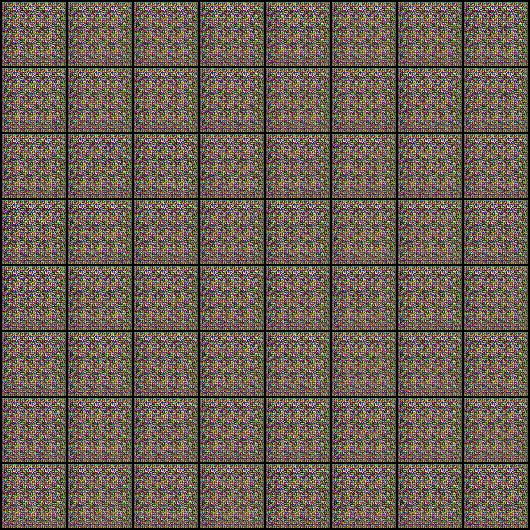

In [ ]:
Image('./generated/generated-images-0001.png')

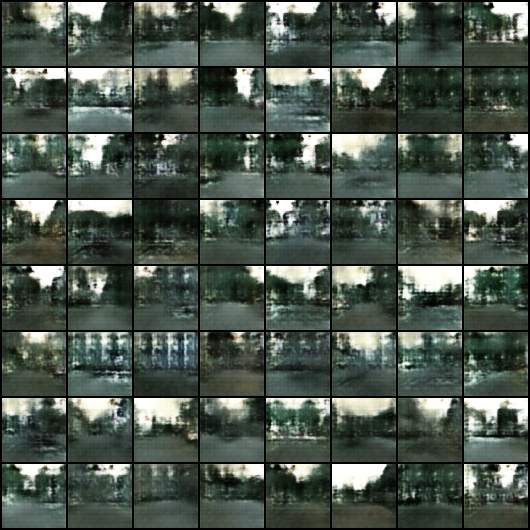

In [ ]:
Image('./generated/generated-images-0050.png')

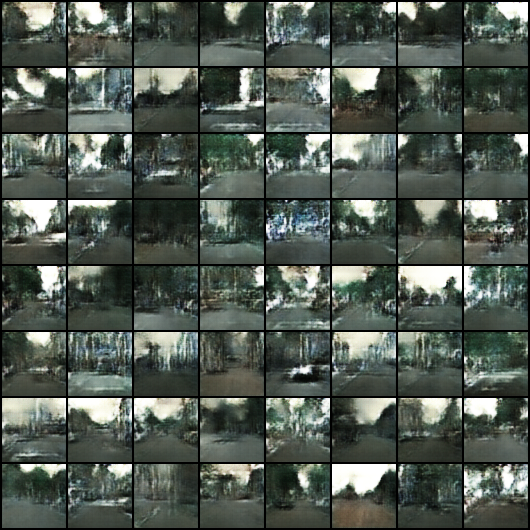

In [ ]:
Image('./generated/generated-images-0100.png')

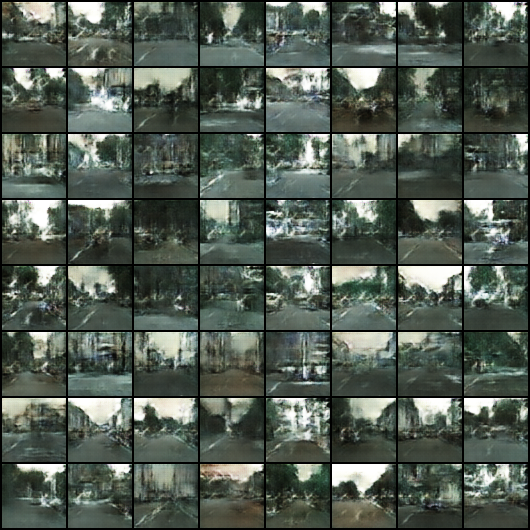

In [ ]:
Image('./generated/generated-images-0150.png')

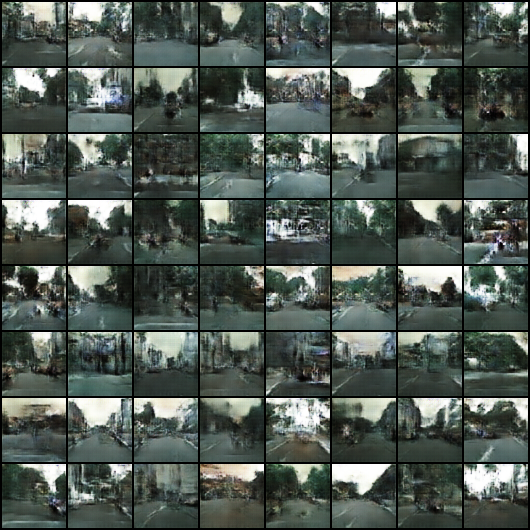

In [ ]:
Image('./generated/generated-images-0200.png')

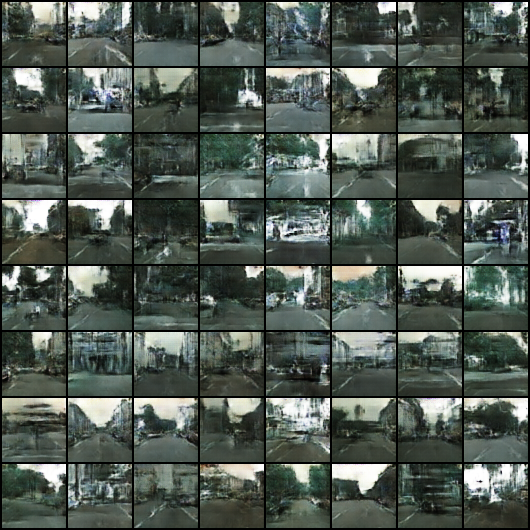

In [ ]:
Image('./generated/generated-images-0250.png')

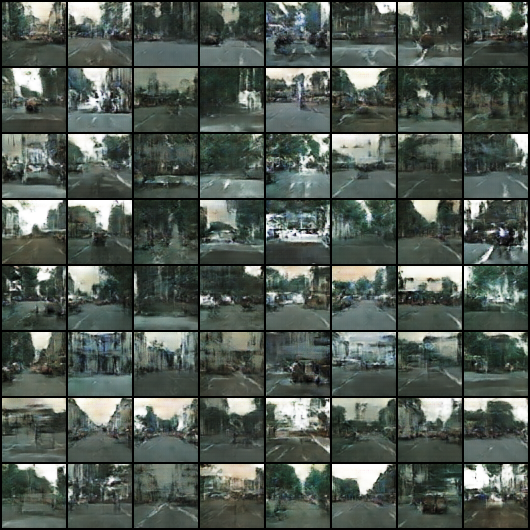

In [ ]:
Image('./generated/generated-images-0300.png')

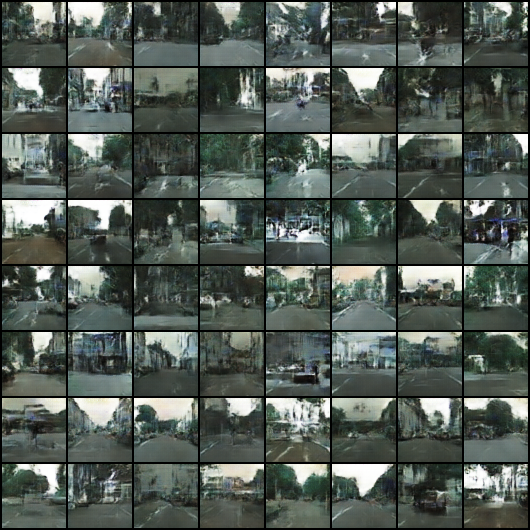

In [ ]:
Image('./generated/generated-images-0350.png')

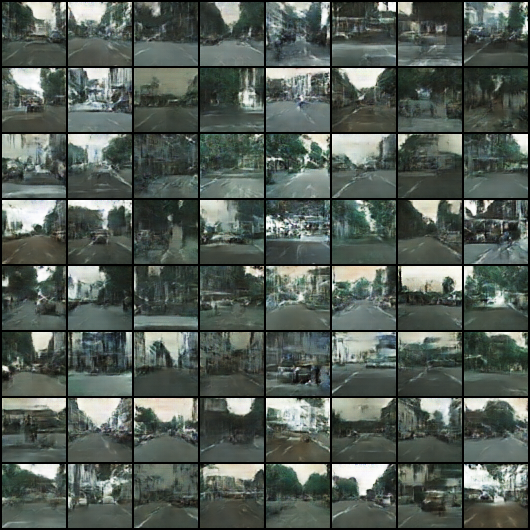

In [ ]:
Image('./generated/generated-images-0400.png')

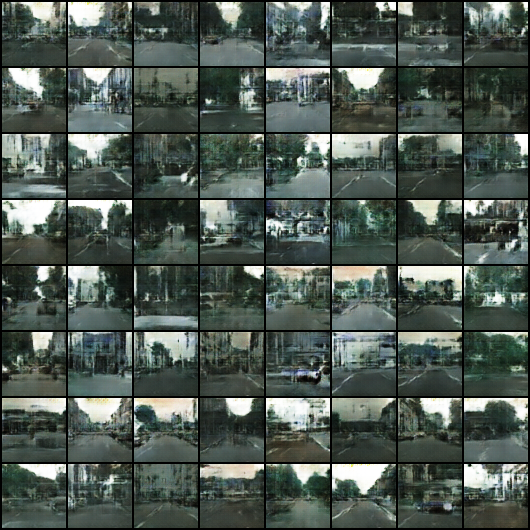

In [ ]:
Image('./generated/generated-images-0450.png')

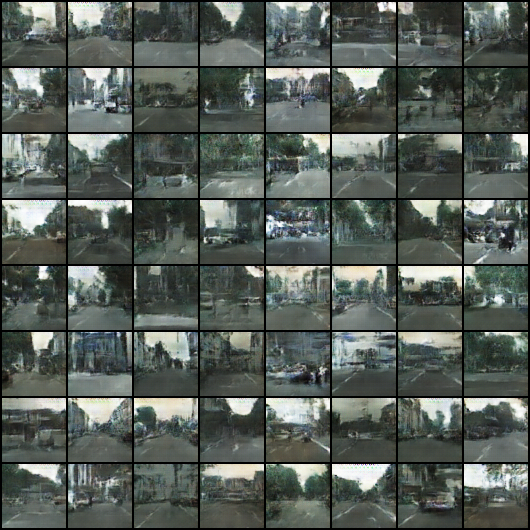

In [ ]:
Image('./generated/generated-images-0500.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

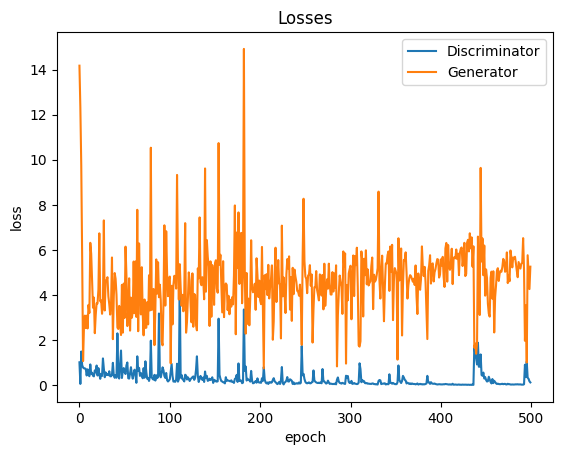

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

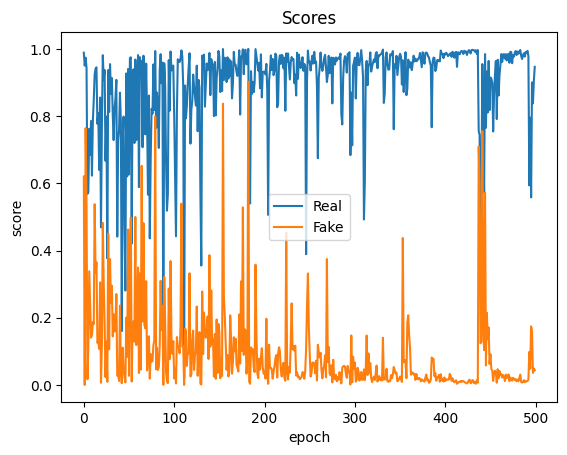

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

Confusion Matrix:
[[ 14 486]
 [ 15 485]]


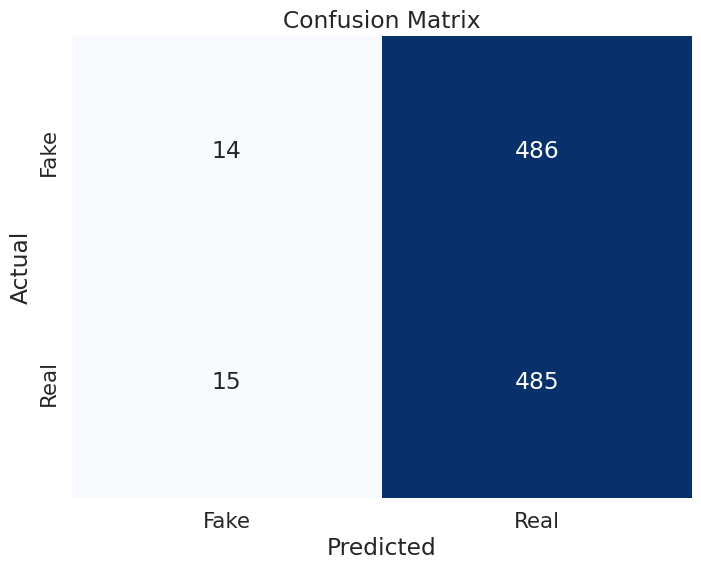

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Function to classify scores and generate confusion matrix
def calculate_confusion_matrix(real_scores, fake_scores):
    # Set threshold for classification
    threshold = 0.5

    # Classify scores as real or fake based on threshold
    real_predictions = [1 if score >= threshold else 0 for score in real_scores]
    fake_predictions = [1 if score < threshold else 0 for score in fake_scores]

    # Combine predictions
    all_predictions = real_predictions + fake_predictions

    # Create ground truth labels
    all_labels = [1] * len(real_scores) + [0] * len(fake_scores)

    # Calculate confusion matrix
    cm = confusion_matrix(all_labels, all_predictions)

    return cm

# Call the function to calculate confusion matrix
conf_matrix = calculate_confusion_matrix(real_scores, fake_scores)
print("Confusion Matrix:")
print(conf_matrix)

def plot_confusion_matrix(cm):
    plt.figure(figsize=(8, 6))
    sns.set(font_scale=1.4)  # Adjust font size
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False,
                xticklabels=['Fake', 'Real'], yticklabels=['Fake', 'Real'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

# Call the function to calculate and plot confusion matrix
plot_confusion_matrix(conf_matrix)